# YOLO
This notebook uses UltraLytics' YOLO library that can be found here : [ultralytics.com](https://docs.ultralytics.com/)
It is used for eye detection, optic disk detection and eye side detection

In [1]:
from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt
from pathlib import Path
import numpy as np
import math
import random

In [6]:
# Load a pretrained YOLOv11 model (Nano version, fastest)
model = YOLO("models/yolo11x-cls.pt")

In [7]:
# Train
model.train(
    data="datasets/classification",
    epochs=150,
    imgsz=640,
    project="runs/train",
    name="eye_side_classification",
)

New https://pypi.org/project/ultralytics/8.3.213 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.206  Python-3.12.10 torch-2.8.0+cu126 CUDA:0 (NVIDIA RTX A6000, 49140MiB)
engine\trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=datasets/classification, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=150, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=models/yolo11x-cls.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=eye_side_classification

ultralytics.utils.metrics.ClassifyMetrics object with attributes:

confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x000001F6A205A0C0>
curves: []
curves_results: []
fitness: 0.9689441025257111
keys: ['metrics/accuracy_top1', 'metrics/accuracy_top5']
results_dict: {'metrics/accuracy_top1': 0.9378882050514221, 'metrics/accuracy_top5': 1.0, 'fitness': 0.9689441025257111}
save_dir: WindowsPath('C:/Users/Domodekavkaz/Documents/Stage/papillae_detection/runs/train/eye_side_classification4')
speed: {'preprocess': 0.4422739126447658, 'inference': 3.8475285715174787, 'loss': 0.000150932464748621, 'postprocess': 0.0005378883175829552}
task: 'classify'
top1: 0.9378882050514221
top5: 1.0

---

In [2]:
def circle_from_points(p1, p2, p3):
    """Return (cx, cy, r) for the circle passing through 3 points, or None if collinear."""
    (x1, y1), (x2, y2), (x3, y3) = p1, p2, p3
    temp = x2**2 + y2**2
    bc = (x1**2 + y1**2 - temp) / 2
    cd = (temp - x3**2 - y3**2) / 2
    det = (x1 - x2) * (y2 - y3) - (x2 - x3) * (y1 - y2)
    if abs(det) < 1e-12:
        return None
    cx = (bc * (y2 - y3) - cd * (y1 - y2)) / det
    cy = ((x1 - x2) * cd - (x2 - x3) * bc) / det
    r = math.sqrt((x1 - cx)**2 + (y1 - cy)**2)
    return cx, cy, r


def ransac_circle(points, n_iter=500, tol=1.0):
    """
    Fit a circle using RANSAC.
    Returns (cx, cy, r, inliers) for the best circle.
    """
    best_circle = None
    best_inliers = []

    if len(points) < 3:
        return None, []

    for _ in range(n_iter):
        sample = random.sample(points, 3)
        circle = circle_from_points(*sample)
        if circle is None:
            continue
        cx, cy, r = circle

        # Count inliers
        inliers = []
        for p in points:
            d = abs(math.hypot(p[0] - cx, p[1] - cy) - r)
            if d < tol:
                inliers.append(p)

        if len(inliers) > len(best_inliers):
            best_inliers = inliers
            best_circle = (cx, cy, r)

    if best_circle is None:
        return None, []

    return (*best_circle, best_inliers)

In [3]:
def get_enclosing_circle(prediction_results, filename, n_iter=500, tol=1.0):
    res = prediction_results[0]

    if not hasattr(res, "masks") or res.masks is None:
        print(f"[Warning] No mask found for {filename}")
        return None, []

    masks = res.masks.data.cpu().numpy()
    idx = np.argmax(res.boxes.conf.cpu().numpy())
    mask = (masks[idx] > 0.5).astype(np.uint8)

    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if not contours:
        print(f"[Warning] No contour for {filename}")
        return None, []

    largest_contour = max(contours, key=cv2.contourArea)
    pts = largest_contour.squeeze().tolist()
    if len(pts) < 3:
        print(f"[Warning] Not enough points for {filename}")
        return None, []

    # --- Use RANSAC to fit a circle ---
    cx, cy, r, inliers = ransac_circle(pts, n_iter=n_iter, tol=tol)
    if cx is None:
        print(f"[Warning] RANSAC failed for {filename}")
        return None, []

    return cx, cy, r, inliers

In [7]:
def show_enclosing_circles(model, image_dir, image_numbers, conf=0.25, cols=5, figsize=(20, 10)):
    """
    Predicts segmentation masks for multiple images and displays
    the RANSAC-fitted circle for each.
    """
    image_dir = Path(image_dir)
    rows = int(np.ceil(len(image_numbers) / cols))
    plt.figure(figsize=figsize)

    for i, num in enumerate(image_numbers):
        filename = f"{num:04d}.png"
        img_path = image_dir / filename

        results = model.predict(source=str(img_path), conf=conf, verbose=False, show=False, save=False)

        cx, cy, r, inliers = get_enclosing_circle(results, filename, n_iter=500, tol=conf)
        if cx is None:
            print(f"[Warning] Could not get circle from {filename}")
            continue

        # Draw overlay
        img = cv2.imread(str(img_path))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        overlay = img.copy()
        cv2.circle(overlay, (int(cx), int(cy)), int(r), (0, 255, 0), 2)
        cv2.circle(overlay, (int(cx), int(cy)), 3, (0, 255, 0), -1)
        blended = cv2.addWeighted(img, 0.7, overlay, 0.3, 0)

        # Plot
        plt.subplot(rows, cols, i + 1)
        plt.imshow(blended)
        plt.title(filename)
        plt.axis("off")

    plt.tight_layout()
    plt.show()


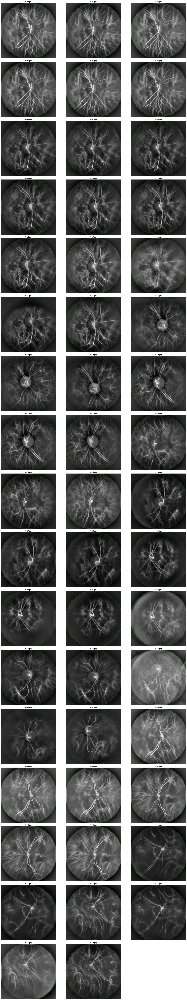

In [8]:
trained_model = YOLO("runs/train/eye_detector_segmentation4/weights/best.pt")
show_enclosing_circles(trained_model, "data/eye/train", range(500, 550), cols=3, figsize=(20, 100))